In [15]:
import scanpy as sc
import squidpy as sq
import numpy as np
from skimage import io, morphology
from anndata import AnnData
import napari
import pandas as pd
import matplotlib
import matplotlib.pyplot as plt
import geopandas
from napari_sparrow import functions as fc

In [16]:
# Path tho the folder containing the adata.h5ad & adata.geojson file
path_adata = './'

def adata_from_h5ad_geojson(path):
    path_h5ad = path + "adata.h5ad"
    path_geojson = path + "adata.geojson"
    
    adata = sc.read(path_h5ad)
    geometry = geopandas.read_file(path_geojson)
    
    print(geometry)

    adata.obsm["polygons"]["geometry"]= list(geometry["geometry"])
    adata.obsm["polygons"] = geopandas.GeoDataFrame(adata.obsm["polygons"])
    
    l = adata.n_obs
    
    # default color
    adata.obsm["polygons"]["color_border"] = l*[(0.8392156862745098, 0.15294117647058825, 0.1568627450980392, 1.0)]
    
    return adata

adata = adata_from_h5ad_geojson(path_adata)

       index                                           geometry
0          1  POLYGON ((148.00000 1609.00000, 145.00000 1609...
1          2                           GEOMETRYCOLLECTION EMPTY
2          3  POLYGON ((64.00000 1582.00000, 61.00000 1582.0...
3          4                           GEOMETRYCOLLECTION EMPTY
4          5  POLYGON ((70.00000 1717.00000, 73.00000 1717.0...
...      ...                                                ...
64243  64244                           GEOMETRYCOLLECTION EMPTY
64244  64245                           GEOMETRYCOLLECTION EMPTY
64245  64246                           GEOMETRYCOLLECTION EMPTY
64246  64247                           GEOMETRYCOLLECTION EMPTY
64247  64248                           GEOMETRYCOLLECTION EMPTY

[64248 rows x 2 columns]


In [17]:
adata.X

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 1, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]])

In [18]:
adata.obsm["polygons"]

,X,Y,linewidth,geometry,color_border
1,15.625000,1526.625000,1,"POLYGON ((148.000 1609.000, 145.000 1609.000, ...","(0.8392156862745098, 0.15294117647058825, 0.15..."
2,104.200000,1486.000000,1,GEOMETRYCOLLECTION EMPTY,"(0.8392156862745098, 0.15294117647058825, 0.15..."
3,52.760000,1571.200000,1,"POLYGON ((64.000 1582.000, 61.000 1582.000, 58...","(0.8392156862745098, 0.15294117647058825, 0.15..."
4,109.292254,1531.125000,1,GEOMETRYCOLLECTION EMPTY,"(0.8392156862745098, 0.15294117647058825, 0.15..."
5,55.619537,1634.210797,1,"POLYGON ((70.000 1717.000, 73.000 1717.000, 76...","(0.8392156862745098, 0.15294117647058825, 0.15..."
...,...,...,...,...,...
64244,1371.333333,4586.666667,1,GEOMETRYCOLLECTION EMPTY,"(0.8392156862745098, 0.15294117647058825, 0.15..."
64245,8516.666667,8565.666667,1,GEOMETRYCOLLECTION EMPTY,"(0.8392156862745098, 0.15294117647058825, 0.15..."
64246,6782.333333,6129.666667,1,GEOMETRYCOLLECTION EMPTY,"(0.8392156862745098, 0.15294117647058825, 0.15..."
64247,7027.625000,5266.125000,1,GEOMETRYCOLLECTION EMPTY,"(0.8392156862745098, 0.15294117647058825, 0.15..."


In [19]:
adata.obsm["spatial"]

array([[  15.625     , 1526.625     ],
       [ 104.2       , 1486.        ],
       [  52.76      , 1571.2       ],
       ...,
       [6782.33333333, 6129.66666667],
       [7027.625     , 5266.125     ],
       [7117.        , 4961.        ]])

In [20]:
# test if the image was loaded in correctly at Julia side
img = io.imread("data/20272_slide1_A1-1_DAPI.tiff")
np.all(adata.uns["spatial"]["melanoma"]["images"]["hires"] == img)

True

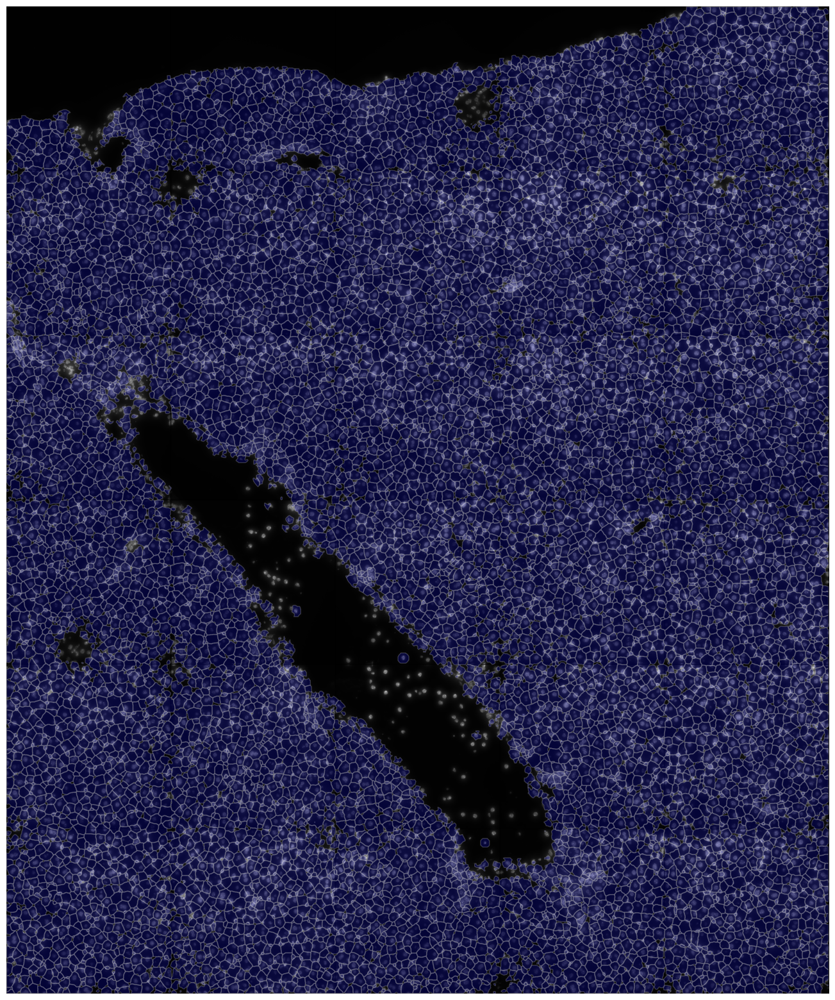

In [21]:
# Try plotting polygons
fc.plot_shapes(adata, alpha = 0.2) # -> fails as there is no image data in the adata object

#adata.obsm["polygons"].plot(
#    edgecolor="white",
#    linewidth=adata.obsm["polygons"].linewidth,
#    alpha=1.0,
#    legend=True,
#    color="blue",
#    aspect=1,
#    figsize=(20, 20)
#)

In [22]:
adata.obs.index

Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10',
       ...
       '64239', '64240', '64241', '64242', '64243', '64244', '64245', '64246',
       '64247', '64248'],
      dtype='object', length=64248)

In [23]:
masks = adata.uns["spatial"]["melanoma"]["segmentation"]
np.unique(masks).shape

# not all polygons are in this mask?
# TODO: ask what to do about this?

(14613,)

In [24]:
adata.X

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 1, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]])

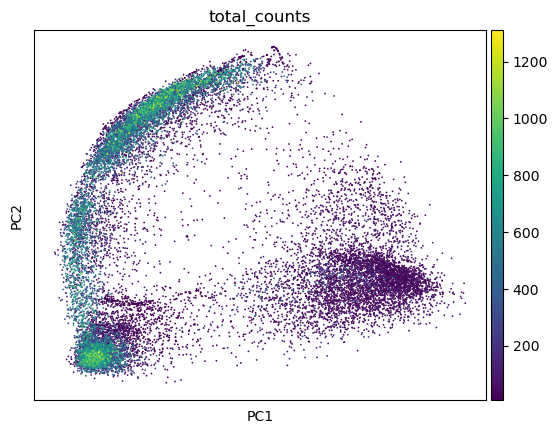

KeyError: 'nucleusSize'

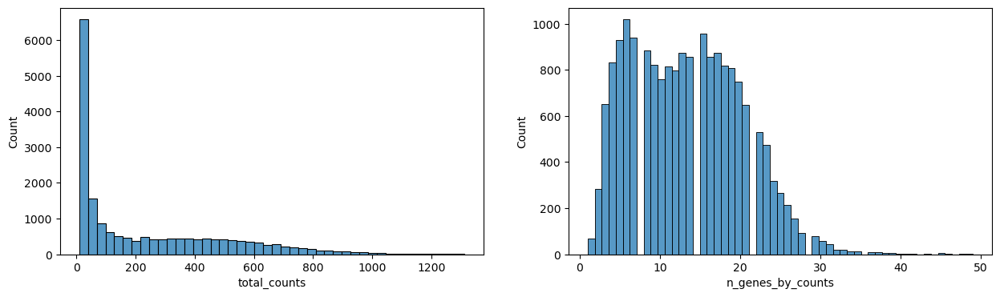

In [25]:
masks = adata.uns["spatial"]["melanoma"]["segmentation"]
adata, adata_orig = fc.preprocessAdata(adata, masks, nuc_size_norm = False)
fc.preprocesAdataPlot(adata, adata_orig)

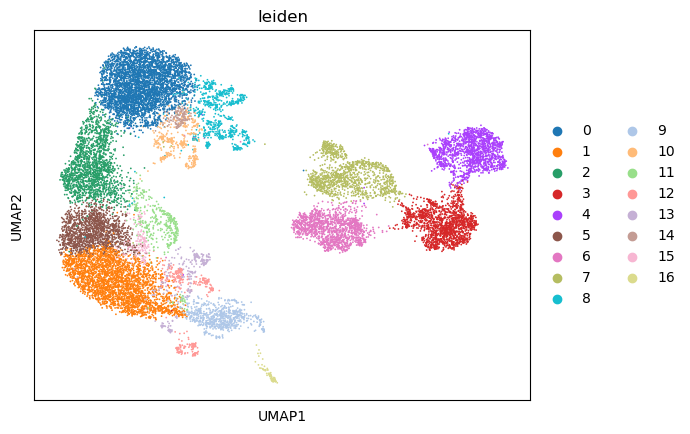

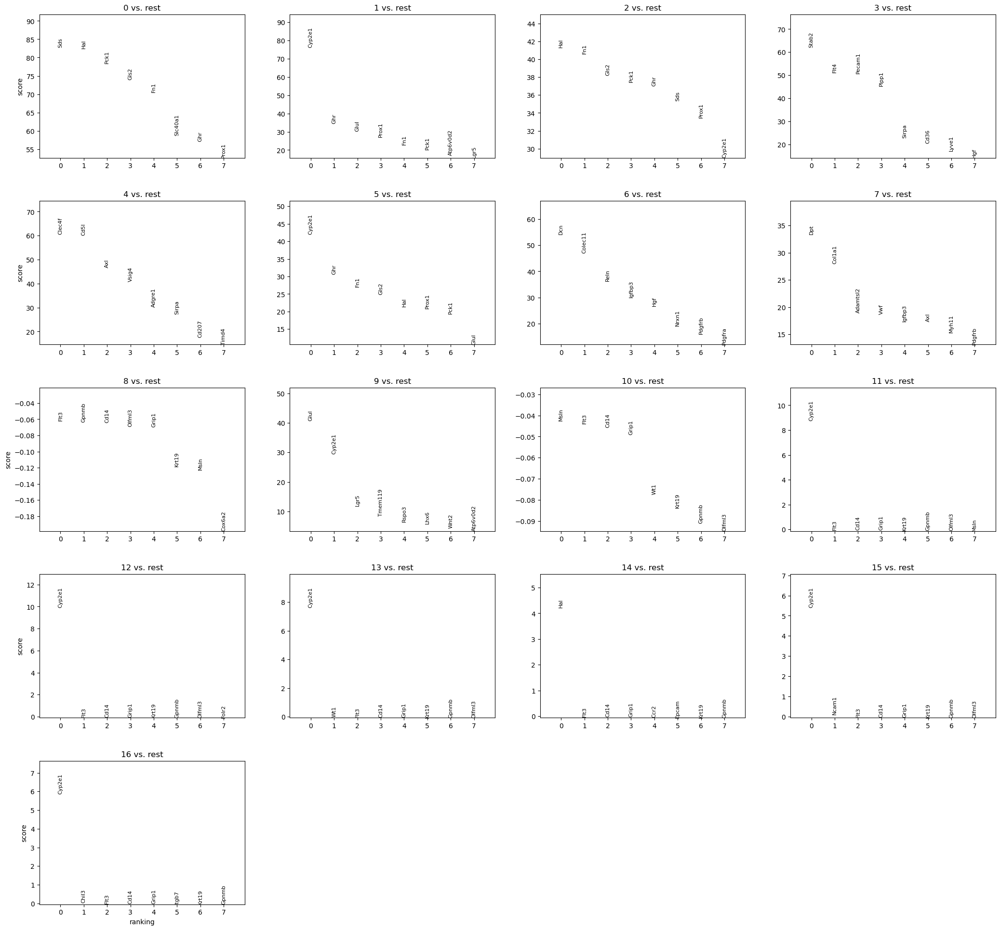

In [26]:
# Try clustering
adata = fc.clustering(adata, 16, 30)
fc.clustering_plot(adata)

/home/smon/miniconda3/envs/napari-sparrow/lib/python3.10/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):
/home/smon/miniconda3/envs/napari-sparrow/lib/python3.10/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):
/home/smon/miniconda3/envs/napari-sparrow/lib/python3.10/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):
/home/smon/miniconda3/envs/napari-sparrow/lib/python3.10/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use 

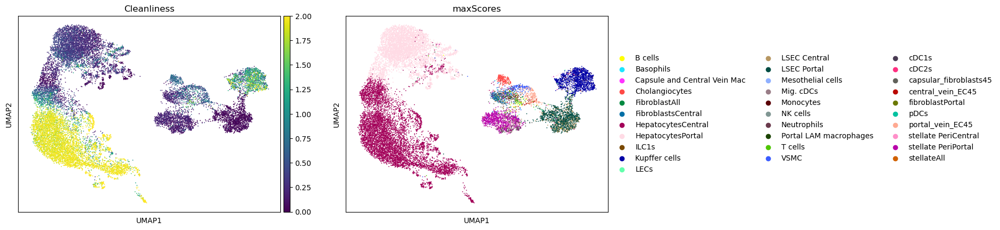

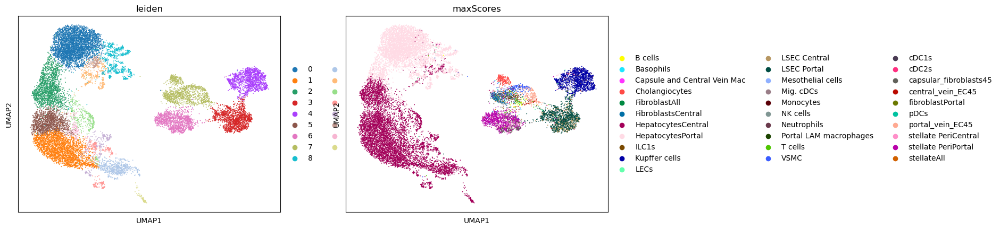

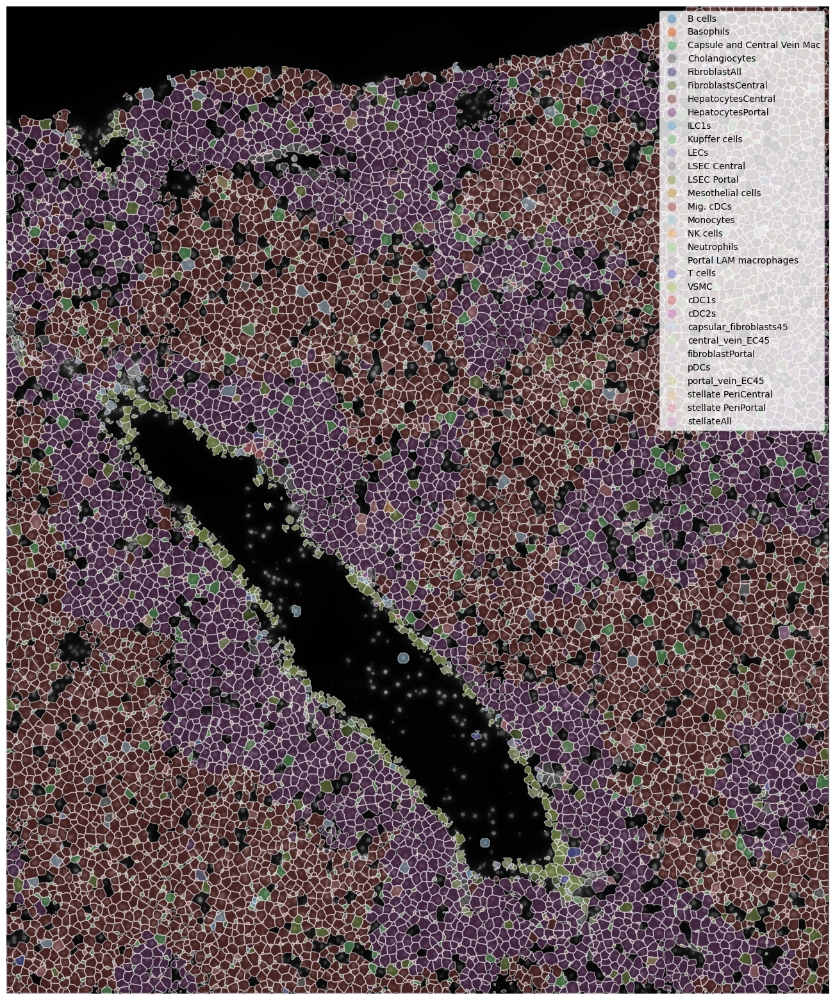

In [ ]:
# try annotation
path_mg = "../../../../data/resolve_liver/markerGeneListMartinNoLow.csv"
mg_dict, scoresper_cluster = fc.scoreGenes(adata, path_mg, repl_columns={"Tot_Score_": "", "uppfer": "upffer"}, del_genes=["Hepatocytes", "LSEC45"])
fc.scoreGenesPlot(adata, scoresper_cluster, 5)